<a href="https://colab.research.google.com/github/GiovanaThais/listasPython/blob/master/Ativ4_processImagem_Transformacao_da_Escala_de_Cinza_e_Filtragem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##             Processamento de Imagens de Computação Gráfica

> Grupo: Andrews da Mota, Giovana Thais e Paulo Ricardo



## **Questões - Transformação da Escala de Cinza**

## Aplicar a função imagemNegativa() para as duas imagens

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from scipy import ndimage


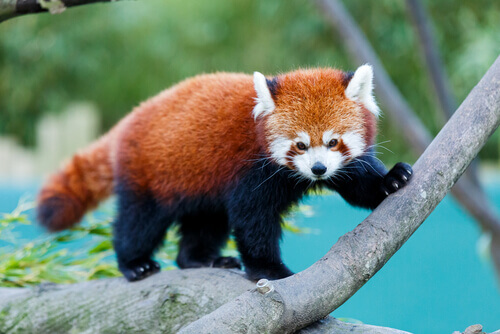

In [ ]:
imagem = cv.imread('/content/panda-vermelho.jpg')
cv2_imshow(imagem)

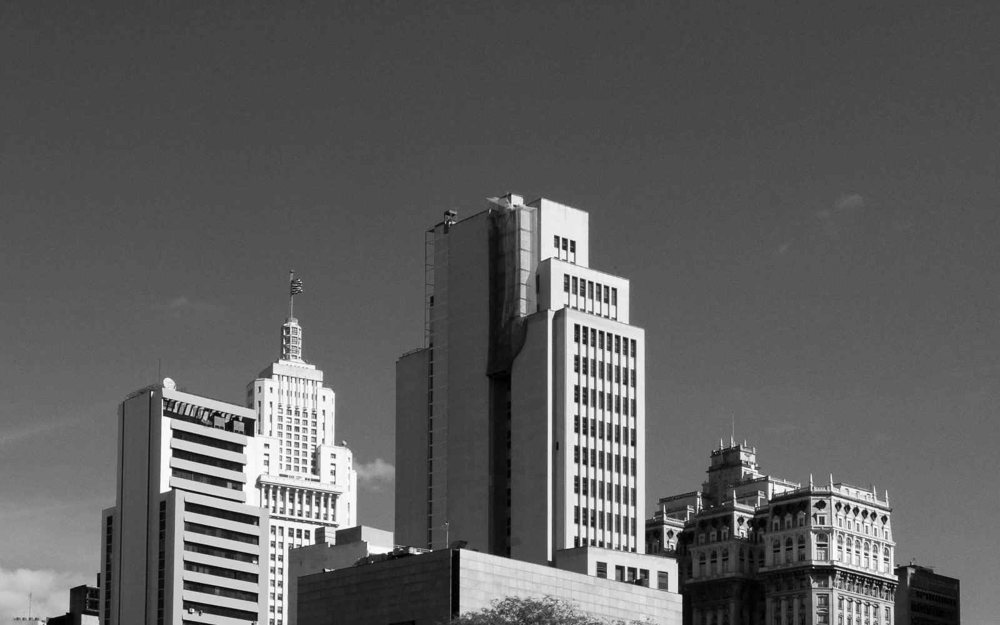

In [ ]:
imagem2 = cv.imread('/content/predios.jpg')
cv2_imshow(imagem2)

In [ ]:
def imagemNegativa(imagem):
  img = -1 * imagem + 255
  return img

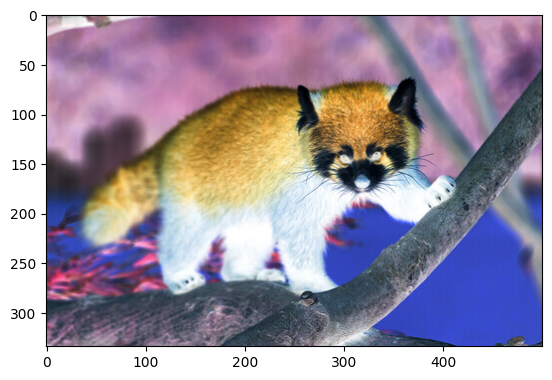

In [ ]:
plt.imshow(imagemNegativa(imagem))

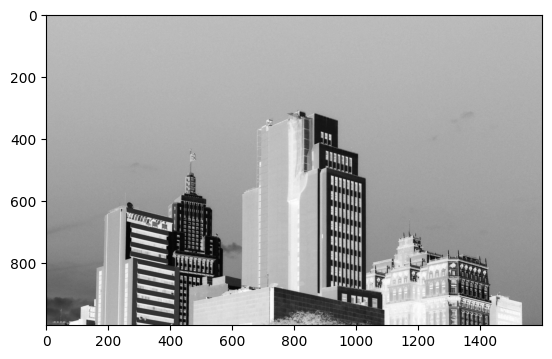

In [ ]:
imagem2_neg = imagemNegativa(imagem2)
plt.imshow(imagemNegativa(imagem2))

## Aplicar a função transformação_linear() para a imagem na escala de cinza, gerar o histograma da imagem original e o histograma da imagem transformada

In [ ]:
def transformacao_linear(imagem, g_min, g_max):
  f_min = min(imagem.flatten())
  f_max = max(imagem.flatten())

  a = (g_max - g_min) / (f_max - f_min)
  b = g_min

  imagem = imagem - f_min

  novaImagem = (a * imagem) + b

  return np.uint8(novaImagem)

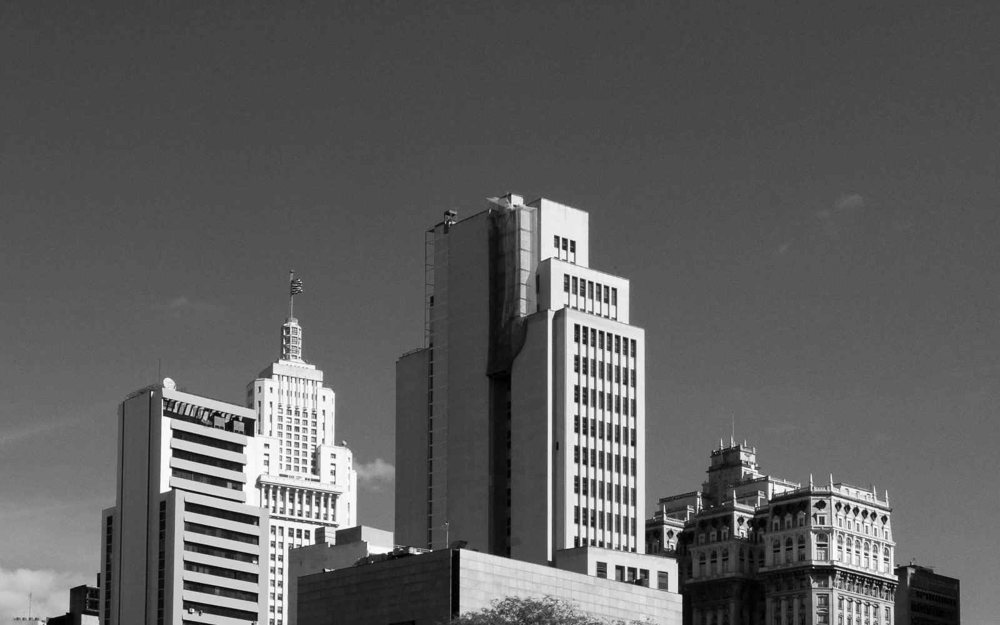

In [ ]:
nova_imagem = transformacao_linear(imagem2, 0, 255)
cv2_imshow(nova_imagem)

In [ ]:
def get_histogram(imagem, limite_cinza):
  array = imagem.flatten()
  hist = np.zeros(limite_cinza, dtype='int')
  for i in range(0, len(array)):
    hist[array[i]] += 1
  return hist

<Figure size 640x480 with 0 Axes>

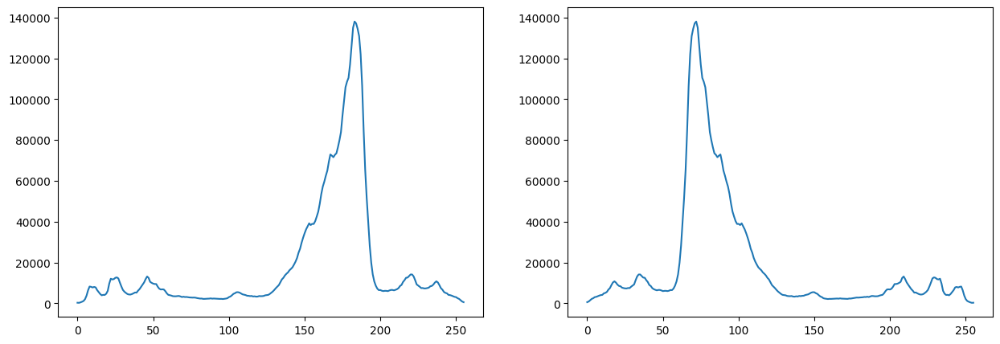

In [ ]:
histograma_contraste = get_histogram(imagem2_neg, 256)
x_contraste = range(len(histograma_contraste))
y_contraste = histograma_contraste

histograma_novaImagem = get_histogram(nova_imagem, 256)
x_novaImagem = range(len(histograma_novaImagem))
y_novaImagem = histograma_novaImagem

plt.clf()
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.plot(x_contraste, y_contraste)

plt.subplot(122)
plt.plot(x_novaImagem, y_novaImagem)

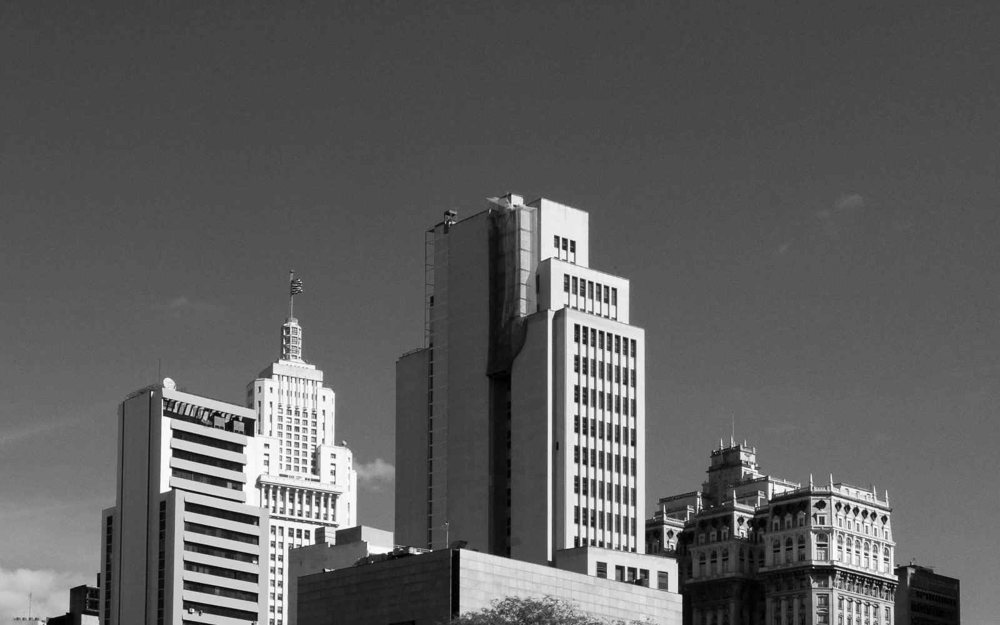

<ipython-input-12-0823af08355a>:5: RuntimeWarning: divide by zero encountered in log
  img = a * np.log(img0 + 1)


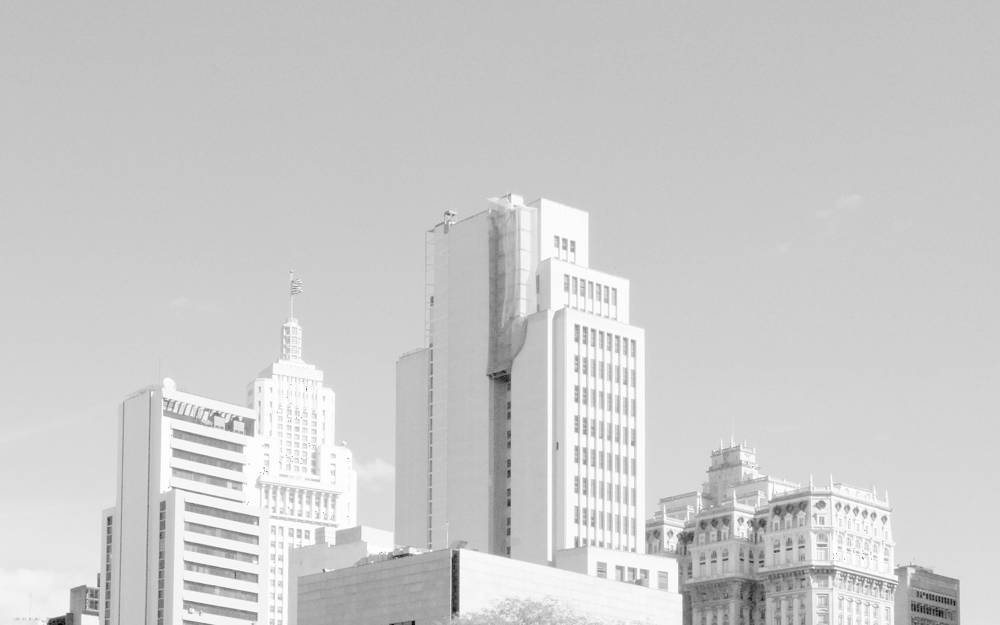

In [ ]:
img0 = imagem2
cv2_imshow(img0)

a = 255 / (np.log(1 + np.max(img0)))
img = a * np.log(img0 + 1)

img = np.array(img, dtype=np.uint8)
cv2_imshow(img)

<Figure size 640x480 with 0 Axes>

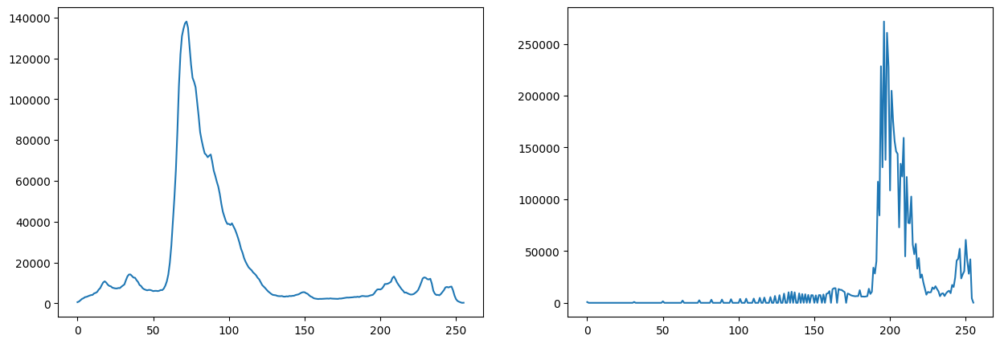

In [ ]:
histograma_logaritmo = get_histogram(img0, 256)
x_contraste = range(len(histograma_logaritmo))
y_contraste = histograma_logaritmo

histograma_novaImagem = get_histogram(img, 256)
x_novaImagem = range(len(histograma_novaImagem))
y_novaImagem = histograma_novaImagem

plt.clf()
plt.figure(figsize=(15,5))
plt.subplot(121)
plt.plot(x_contraste, y_contraste)

plt.subplot(122)
plt.plot(x_novaImagem, y_novaImagem)

## Equalizar o histograma (da imagem original) gerado para obter uma melhor distribuição de níveis de cinza ao longo do histograma

Etapas de equalização:

In [ ]:
x = 1314 + 3837 + 5820 + 4110 + 2374 + 921 + 629 + 516
print(x) #soma de pixels

19521


In [ ]:
p0 = 1314 / 19521 #probabilidade
print('p0 -> %.2f' % p0)

p1 = 3837 / 19521
print('p1 -> %.2f' % p1)

p2 = 5820 / 19521
print('p2 -> %.2f' % p2)

p3 = 4110 / 19521
print('p3 -> %.2f' % p3)

p4 = 2374 / 19521
print('p4 -> %.2f' % p4)

p5 = 921 / 19521
print('p5 -> %.2f' % p5)

p6 = 629 / 19521
print('p6 -> %.2f' % p6)

p7 = 516 / 19521
print('p7 -> %.2f' % p7)

p0 -> 0.07
p1 -> 0.20
p2 -> 0.30
p3 -> 0.21
p4 -> 0.12
p5 -> 0.05
p6 -> 0.03
p7 -> 0.03


In [ ]:
g0 = 0.07 #DISTRIBUIÇÃO ACUMULADA DE PROBABILIDADE
print('g0 -> %.2f' % g0)

g1 = 0.07 + 0.20
print('g1 -> %.2f' % g1)

g2 = 0.07 + 0.20 + 0.30
print('g2 -> %.2f' % g2)

g3 = 0.07 + 0.20 + 0.30 + 0.21
print('g3 -> %.2f' % g3)

g4 = 0.07 + 0.20 + 0.30 + 0.21 + 0.12
print('g4 -> %.2f' % g4)

g5 = 0.07 + 0.20 + 0.30 + 0.21 + 0.12 + 0.05
print('g5 -> %.2f' % g5)

g6 = 0.07 + 0.20 + 0.30 + 0.21 + 0.12 + 0.05 + 0.03
print('g6 -> %.2f' % g6)

g7 = 0.07 + 0.20 + 0.30 + 0.21 + 0.12 + 0.05 + 0.03 + 0.03
print('g7 -> %.2f' % g7)

g0 -> 0.07
g1 -> 0.27
g2 -> 0.57
g3 -> 0.78
g4 -> 0.90
g5 -> 0.95
g6 -> 0.98
g7 -> 1.01


In [ ]:
g0 = 0.07 * 7 #calculando normalizador
print('g0 -> %.2f' % g0)

g1 = 0.27 * 7
print('g1 -> %.2f' % g1)

g2 = 0.57 * 7
print('g2 -> %.2f' % g2)

g3 = 0.78 * 7
print('g3 -> %.2f' % g3)

g4 = 0.90 * 7
print('g4 -> %.2f' % g4)

g5 = 0.95 * 7
print('g5 -> %.2f' % g5)

g6 = 0.98 * 7
print('g6 -> %.2f' % g6)

g7 = 1.01 * 7
print('g7 -> %.2f' % g7)

g0 -> 0.49
g1 -> 1.89
g2 -> 3.99
g3 -> 5.46
g4 -> 6.30
g5 -> 6.65
g6 -> 6.86
g7 -> 7.07


In [ ]:
img = cv.imread('/content/predios.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

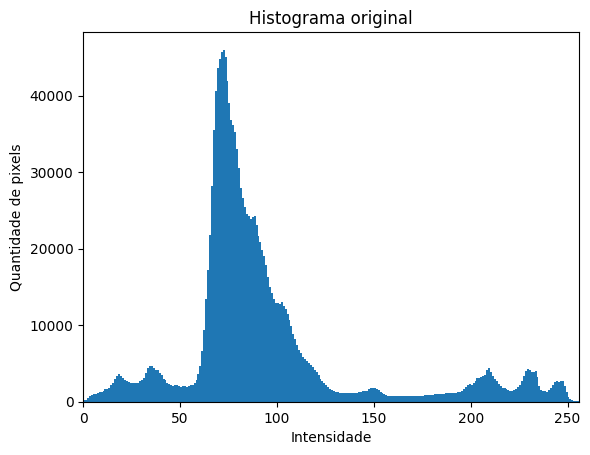

In [ ]:
plt.figure()
plt.title('Histograma original')
plt.xlabel('Intensidade')
plt.ylabel('Quantidade de pixels')
plt.hist(img.ravel(), 256, [0,256])
plt.xlim([0,256])
plt.show()

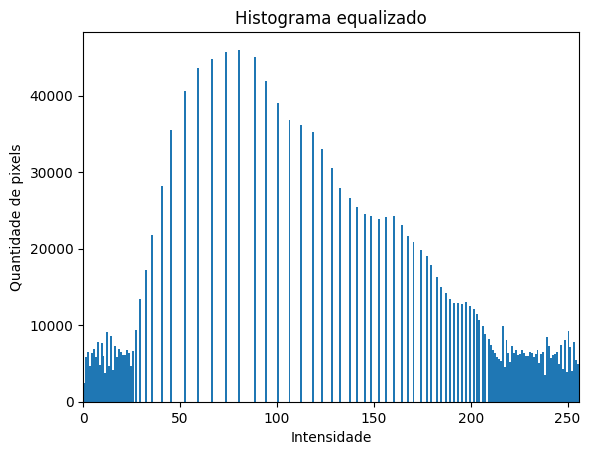

In [ ]:
h_eq = cv.equalizeHist(img)

plt.title('Histograma equalizado')
plt.xlabel('Intensidade')
plt.ylabel('Quantidade de pixels')
plt.hist(h_eq.ravel(), 256, [0,256])
plt.xlim([0,256])
plt.show()

**Implementar funções para representar a transformação pela raiz quadrada e a transformação pelo
mapeamento quadrado da imagem disponibilizada no Classroom (img03). Depois, gerar os
histogramas de duas imagens na escala de cinza, e em seguida, compare os resultados.**

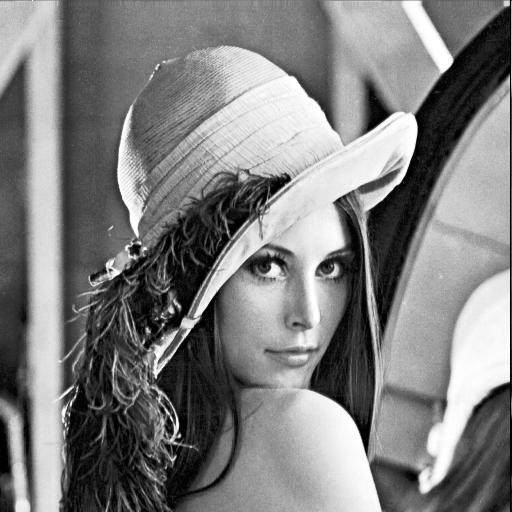

In [ ]:
imagem3 = cv.imread('/content/img03.jpg', cv.IMREAD_GRAYSCALE)
cv2_imshow(imagem3)

## **Questões - Filtragem**

**Transformação pela raiz quadrada**

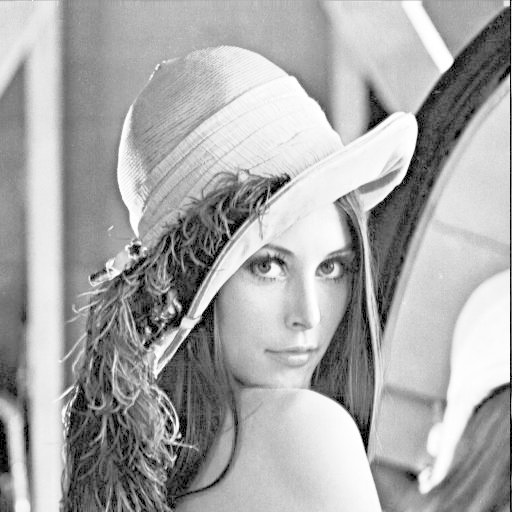

In [ ]:
# carrega a imagem
img_raiz = imagem3

# transforma a matriz em float para permitir valores negativos
img_float_raiz = np.float32(img_raiz)

# aplica a transformação pela raiz quadrada
img_raiz = np.sqrt(img_float_raiz)

# normaliza a matriz para o intervalo 0-255
img_norm_raiz = cv.normalize(img_raiz, None, 0, 255, cv.NORM_MINMAX)

# converte de volta para um tipo inteiro de 8 bits
img_final_raiz = np.uint8(img_norm_raiz)

# exibe o resultado final
cv2_imshow(img_final_raiz)


#**Transformação pelo mapeamento quadrado**


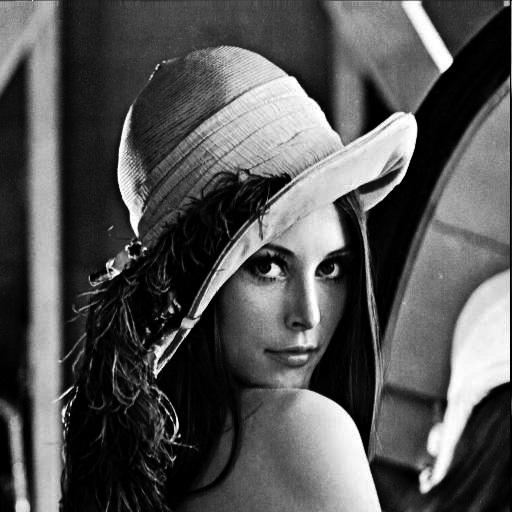

In [ ]:
# carrega a imagem
img_quad = imagem3

# transforma a matriz em float para permitir valores negativos
img_float_quad = np.float32(img_quad)

# aplica a transformação pelo mapeamento quadrado
img_quad = img_float_quad ** 2

# normaliza a matriz para o intervalo 0-255
img_norm_quad = cv.normalize(img_quad, None, 0, 255, cv.NORM_MINMAX)

# converte de volta para um tipo inteiro de 8 bits
img_final_quad = np.uint8(img_norm_quad)

# exibe o resultado final
cv2_imshow(img_final_quad)

<Figure size 640x480 with 0 Axes>

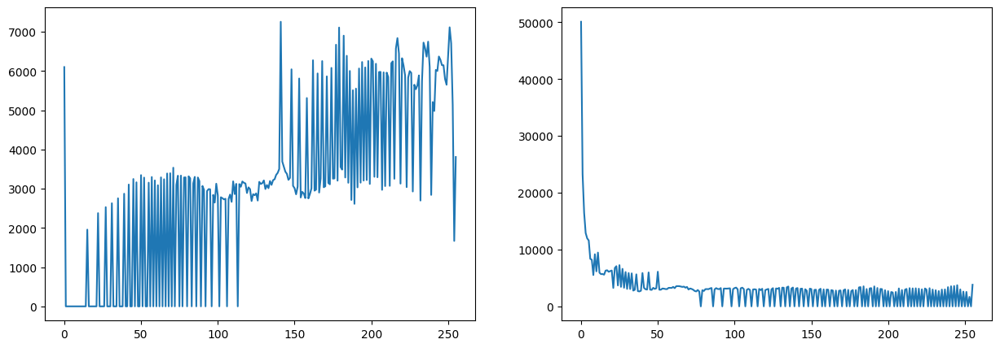

In [ ]:
# Gera o histograma da imagem transformada pela raiz quadrada
histograma_raiz = get_histogram(img_final_raiz, 256)
x_raiz = range(len(histograma_raiz))
y_raiz = histograma_raiz

# Gera o histograma da imagem transformada pelo mapeamendo quadrado
histograma_quadrado = get_histogram(img_final_quad, 256)
x_quadrado = range(len(histograma_quadrado))
y_quadrado = histograma_quadrado

plt.clf()
plt.figure(figsize=(15,5))

plt.subplot(121)
plt.plot(x_raiz, y_raiz)

plt.subplot(122)
plt.plot(x_quadrado, y_quadrado)

# **Correlação**

In [ ]:
def correlacao(img, img_corr, mascara):
  img_correlacao = np.zeros(np.array(img.shape) + np.array(mascara.shape) - 1)

  for x in range(mascara.shape[0]):
    for y in range(mascara.shape[1]):
      img_correlacao[x:x+img.shape[0], y:y+img.shape[1]] += img * mascara[x,y]

      return img_correlacao.astype('uint8')

In [ ]:
imgOriginal = img_corr = cv.imread('/content/img03.jpg',0)

mascara = np.array([ [-1,0,1], [-2,1,2], [-1,0,1] ])

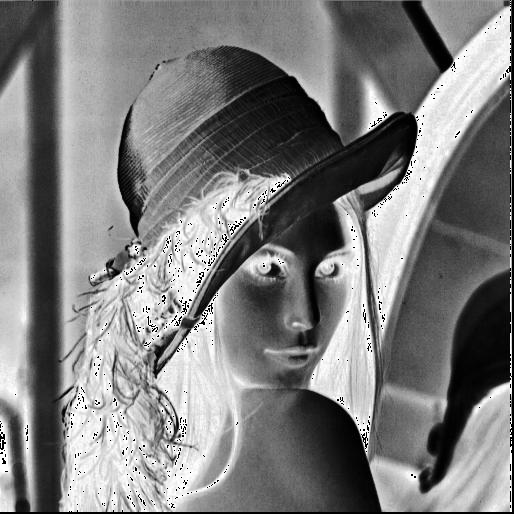

In [ ]:
imagemCorrelacao = correlacao(imgOriginal, img_corr, mascara)
cv2_imshow(imagemCorrelacao)

# **Convolução**

In [ ]:
def rotate_180(image):

  size_image = image.shape
  M = size_image[0]
  N = size_image[1]

  new_image = np.zeros((M,N))

  for i in range (0, M):
    for j in range(0, N):
      new_image[(M-1)-i, (N-1)-j] = image[i,j]

  return new_image

In [ ]:
def get_slice(point, size, image):

  delta = int(size/2)

  a = (point[0] - delta)
  b = (point[1] - delta)

  return image[a:(a+size), b:(b+size)]

In [ ]:
def convolucao(imagem, mascara):

  size_imagem = imagem.shape
  M = size_imagem[0]
  N = size_imagem[1]

  size_mascara = mascara.shape
  m = size_mascara[0]
  n = size_mascara[1]

  nova_imagem = np.zeros(imagem.shape)

  delta = int(m/2)

  for i in range(0+delta, M-delta):
    for j in range(0+delta, N-delta):
      slice_imagem = get_slice((i,j), m, imagem)
      mascara_180 = rotate_180(mascara)
      new_i_j = np.sum(slice_imagem * mascara_180)
      nova_imagem[i,j] = new_i_j

  return nova_imagem

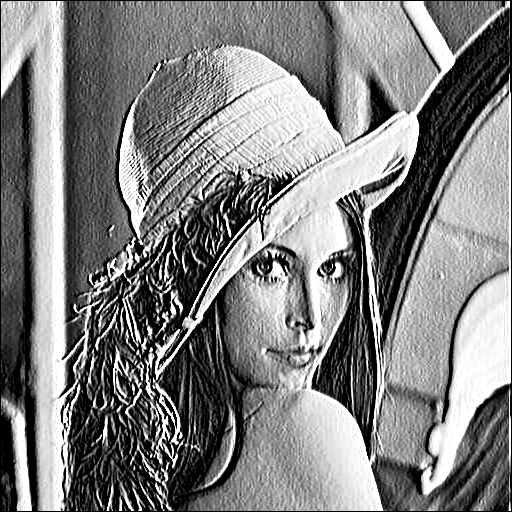

In [ ]:
mascara = np.array([ [-1,0,1], [-2,1,2], [-1,0,1] ])

imagemConvolucao = convolucao(imgOriginal, mascara)
cv2_imshow(imagemConvolucao)

# **Filtros de passa-baixa: Media, Media ponderada, moda e ordem**

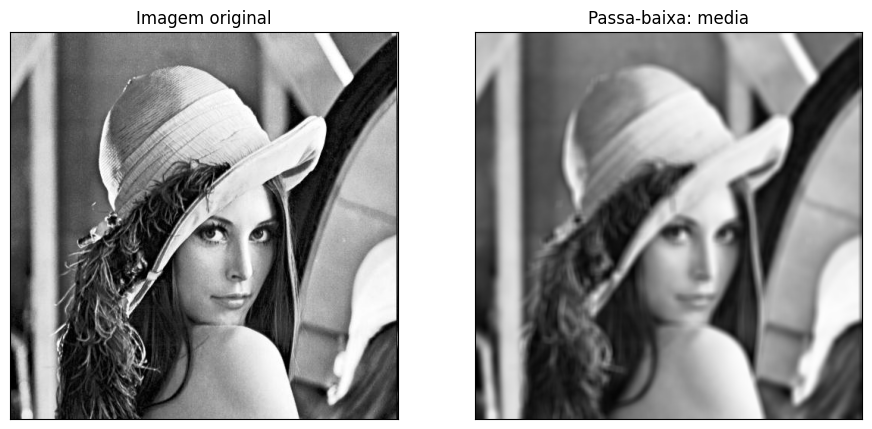

In [ ]:
h1 = 1/9 * np.ones((3,3), dtype='int')
h2 = 1/25 * np.ones((5,5), dtype='int')
h3 = 1/225 * np.ones((15,15), dtype='int')

image_media = imagem3

figure_size = 9
new_image = cv.blur(image_media, (figure_size, figure_size))

plt.figure(figsize=(11,6))
plt.subplot(121)
plt.imshow(image_media)
plt.title('Imagem original')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(new_image)
plt.xticks([])
plt.yticks([])
plt.title('Passa-baixa: media')

plt.show()

Text(0.5, 1.0, 'Passa-baixa: media ponderada')

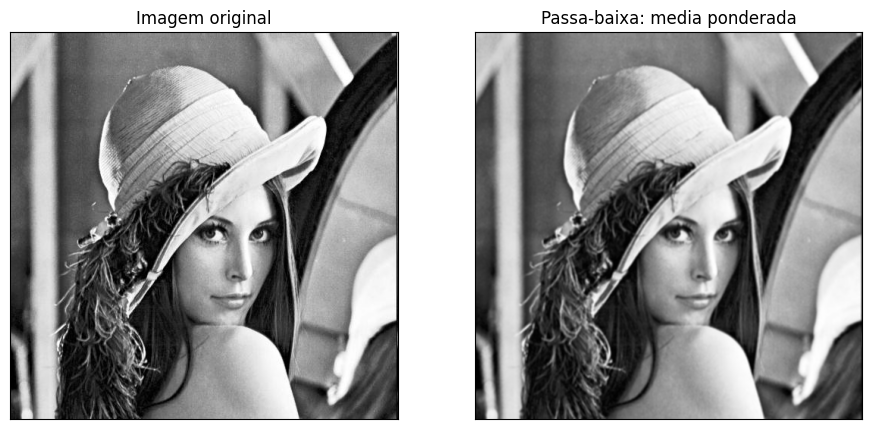

In [ ]:
# Carregar imagem
img_mediap = imagem3

filtered_img = cv.filter2D(img_mediap, -1, h1)

plt.figure(figsize=(11,6))
plt.subplot(121)
plt.imshow(img_mediap)
plt.title('Imagem original')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(filtered_img)
plt.xticks([])
plt.yticks([])
plt.title('Passa-baixa: media ponderada')


Text(0.5, 1.0, 'Passa-baixa: moda')

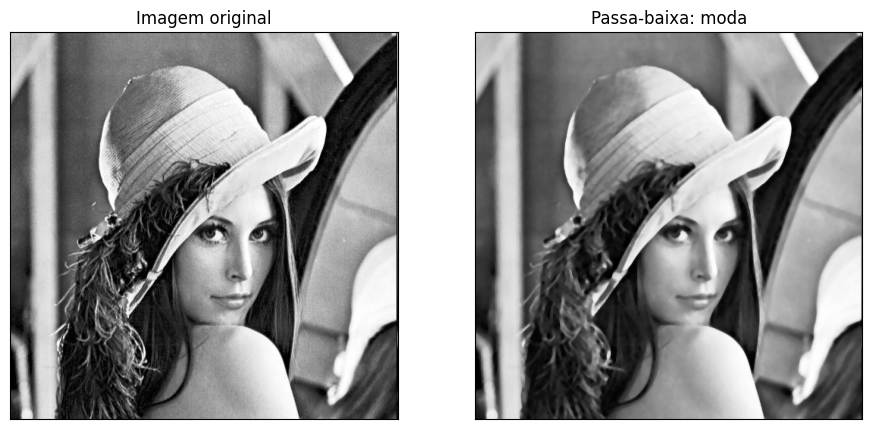

In [ ]:
kernel = np.ones((3, 3), np.float32) / 9
image_blur = imagem3
# Definir o tamanho da janela do filtro de moda
window_size = 5

# Aplicar o filtro de moda na imagem
blurred = ndimage.generic_filter(image_blur, np.nanmedian, size=window_size)


plt.figure(figsize=(11,6))
plt.subplot(121)
plt.imshow(img_mediap)
plt.title('Imagem original')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(blurred)
plt.xticks([])
plt.yticks([])
plt.title('Passa-baixa: moda')

Text(0.5, 1.0, 'Passa-baixa: ordem')

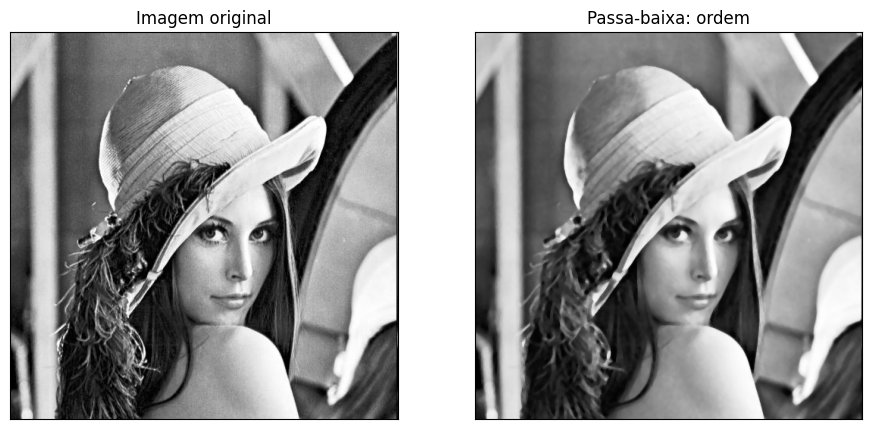

In [ ]:
img_ordem = imagem3

# Aplicar o filtro de ordem na imagem
filtered_order = cv.medianBlur(img_ordem, 5)

# Exibir a imagem original e a imagem filtrada
plt.figure(figsize=(11,6))
plt.subplot(121)
plt.imshow(img_ordem)
plt.title('Imagem original')
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(filtered_order)
plt.xticks([])
plt.yticks([])
plt.title('Passa-baixa: ordem')

# **Filtros de passa-alta: Roberts e Prewitt**

Imagem original


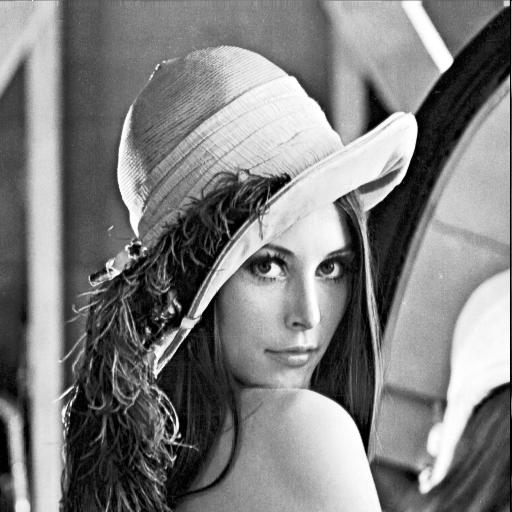

Imagem filtrada - Prewitt horizontal


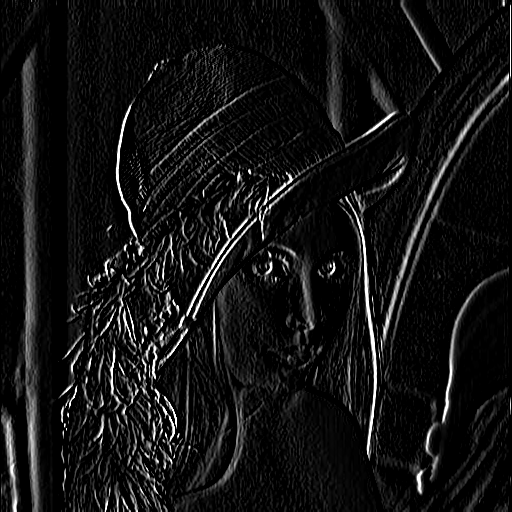

Imagem filtrada - Prewitt vertical


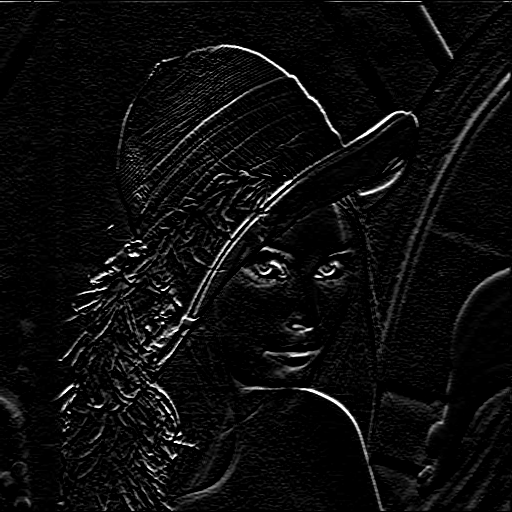

Imagem filtrada - Roberts diagonal 1


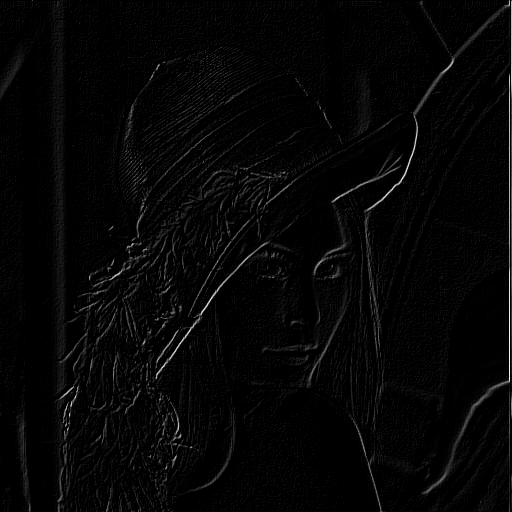

Imagem filtrada - Roberts diagonal 2


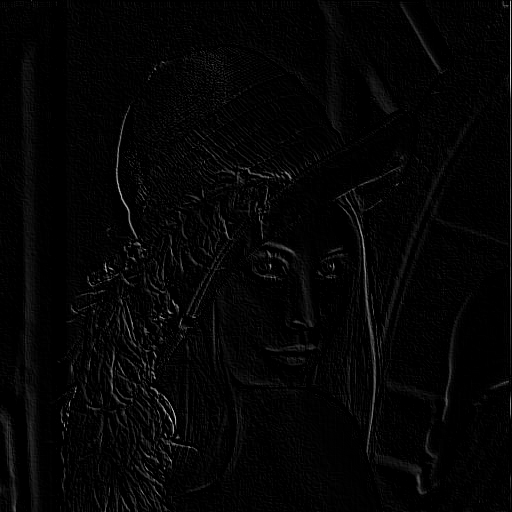

In [ ]:
# Ler a imagem original
img = cv.imread('img03.jpg', 0)

# Definir as máscaras do filtro de Prewitt
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])

# Aplicar o filtro de Prewitt na imagem
filtered_img_prewitt_x = cv.filter2D(img, -1, prewitt_x)
filtered_img_prewitt_y = cv.filter2D(img, -1, prewitt_y)

# Definir as máscaras do filtro de Roberts
roberts_x = np.array([[0, 0, 0], [0, 1, 0], [0, 0, -1]])
roberts_y = np.array([[0, 0, 0], [0, 0, 1], [0, -1, 0]])

# Aplicar o filtro de Roberts na imagem
filtered_img_roberts_x = cv.filter2D(img, -1, roberts_x)
filtered_img_roberts_y = cv.filter2D(img, -1, roberts_y)

# Exibir a imagem original e as imagens filtradas
print('Imagem original')
cv2_imshow(img)
print('Imagem filtrada - Prewitt horizontal')
cv2_imshow( filtered_img_prewitt_x)
print('Imagem filtrada - Prewitt vertical')
cv2_imshow( filtered_img_prewitt_y)
print('Imagem filtrada - Roberts diagonal 1')
cv2_imshow( filtered_img_roberts_x)
print('Imagem filtrada - Roberts diagonal 2')
cv2_imshow(filtered_img_roberts_y)

